In [1]:
import numpy as np
import random
import itertools as it
import os, subprocess
import time
import pickle

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
from mycolorpy import colorlist as mcp

import proplot as pplt

from UQpy.distributions import Normal, Uniform, JointIndependent

import scipy
from scipy.integrate import odeint
import scipy.special

import SALib
from SALib.sample import saltelli

from DimensionReduction import Grassmann
from DimensionReduction import DiffusionMaps
from GDMaps_PCE_GSA import *

# Plotting parameters
mpl.rcParams["figure.dpi"] = 100
mpl.rcParams["legend.fontsize"] = 12.5
mpl.rcParams["font.size"] = 13.5
mpl.rcParams["axes.grid"] = True
mpl.rcParams["grid.alpha"] = 0.3
mpl.rcParams["axes.axisbelow"] = True
mpl.rcParams["figure.figsize"] = (6, 4)
mpl.rcParams["mathtext.fontset"] = "cm"
mpl.rcParams['axes.labelsize'] = 15
mpl.rcParams['axes.titlesize'] = 15

USE_TEX = False

if USE_TEX:
    plt.rc("text", usetex=True)
    plt.rc("text.latex", preamble=r"""
     \usepackage{times}
     \usepackage{mathptmx}""")
else:
    plt.rc("text", usetex=False)
    
plt.rc("font", family="serif")
mpl.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]


In [2]:
if not os.path.exists('plots'):
    os.makedirs('plots')

In [3]:
samples       = np.asarray(range(1024*7))
response_vars = ['SUSCEPTIBLE', 'HOSPITALIZED', 'DEATH', 'RECOVERED', 'ACTIVE']

num_steps     = 180
num_runs      = 20
num_responses = len(response_vars)
num_samples   = len(samples)


In [4]:
# Writing data as pickle for faster access
if not os.path.exists('input_data'):
    os.makedirs('input_data')
    
if not os.path.exists('input_data/results_all_array.pickle'):
    with open('input_data/results_all_array.pickle', 'wb') as f:
        pickle.dump(results_all, f)    
else:
    with open('input_data/results_all_array.pickle', 'rb') as f:
        results_all = pickle.load(f)

In [5]:
print(results_all.shape)

(20, 7168, 5, 180)


In [6]:
# input pararameters
problem = {
  'num_vars': 5, 
  'names': ['R', 
            'SFSusceptibility_Scalar', 
            'SFInfector_Scalar', 
            'B_n_Scalar',
            'lam_gamma_Scalar'],
  'bounds': [[1.9, 6.5], 
             [0.5, 1.5],
             [0.5, 1.5], 
             [0.7, 1.3],
             [0.7, 1.3]]
}

param_names_short = {'R': r'$R$',
            'SFSusceptibility_Scalar': r'$S_F$', 
            'SFInfector_Scalar': r'$A_F$',
            'B_n_Scalar': r'$B_F$',
            'lam_gamma_Scalar': r'$\Gamma_F$', 
}

In [7]:
n_distinct_samples = 2048 #1024

param_vals = saltelli.sample(problem, n_distinct_samples, calc_second_order=False)
saltelli_2048 = np.loadtxt('input_data/saltellisample_2048')

print(np.array_equal(param_vals, param_vals))


True


In [8]:
# Probability distributions of input parameters
# corresponding to the bounds 
print(f'Problem bounds: {problem["bounds"]}')

pdf1 = Uniform(loc=1.9, scale=4.6)  
pdf2 = Uniform(loc=0.5, scale=1.0)  
pdf3 = Uniform(loc=0.5, scale=1.0)
pdf4 = Uniform(loc=0.7, scale=0.6)
pdf5 = Uniform(loc=0.7, scale=0.6)

margs = [pdf1, pdf2, pdf3, pdf4, pdf5]
joint = JointIndependent(marginals=margs)

Problem bounds: [[1.9, 6.5], [0.5, 1.5], [0.5, 1.5], [0.7, 1.3], [0.7, 1.3]]


# Five response variables

In [9]:
# Flatten results

results_flat_run_all = {}

for run in range(num_runs):
    results_flat = np.zeros((num_samples, num_responses*num_steps))
    for sample_idx, sample in enumerate(samples):
        results_flat[sample_idx, :] = results_all[run][sample_idx].ravel()
    results_flat_run_all[run] = results_flat 
    

In [10]:
n2 = results_flat_run_all[0].shape[1]

In [11]:
# Input used in running DeepABM: 1024*7
saltelli_1024 = saltelli_2048[:num_samples]


# Writing data for the entire data

In [12]:
# Ranks to plot as histogram
ranks = []

for i in range(num_runs):
    data_all = results_flat_run_all[i].reshape(-1, 
                               int(np.sqrt(n2)), 
                               int(np.sqrt(n2)))
    
    ranks += [np.linalg.matrix_rank(data_all[i]) for i \
         in range(len(data_all))]

unique, counts = np.unique(ranks, return_counts=True)
print(f'Ranks: \n {np.asarray((unique, counts)).T}')


Ranks: 
 [[    2  2430]
 [    3 14544]
 [    4  3128]
 [    5  3795]
 [    6  1797]
 [    7  1654]
 [    8   804]
 [    9   668]
 [   10   711]
 [   11  1016]
 [   12  1833]
 [   13  8385]
 [   14  6718]
 [   15  7422]
 [   16  7324]
 [   17  9361]
 [   18  7000]
 [   19  6952]
 [   20  6442]
 [   21  7333]
 [   22  9554]
 [   23 14995]
 [   24 12148]
 [   25  7346]]


In [13]:
# List of Grassmannian dimensions p (top unique values from ranks)
p_array = [3, 13, 17, 22, 23, 24]

In [14]:
# parsimonious representation
max_degree = 25

if not os.path.exists('GSA_results'):
    os.makedirs('GSA_results')

    
for p in p_array:
    print(f'p={p}')

    if not os.path.exists(f'GSA_results/parsim/PCE{max_degree}/parsim_1024_input_20_runs_PCE_{max_degree}_p_{p}.npz'):
    
        result = run_PCE_GSA_on_mainfold(p=p, 
                                         data=results_flat_run_all, 
                                         x=saltelli_1024, 
                                         num_runs=20, 
                                         num_params=5, 
                                         n_keep=3, 
                                         dist_obj=joint, 
                                         pce_max_degree=max_degree, 
                                         parsim=True)

        np.savez(f'GSA_results/parsim_1024_input_20_runs_PCE_15_p_3.npz', 
                 x1 = result[0],  # pce_total_Si
                 x2 = result[1],  # pce_first_Si
                 x3 = result[2],  # pce_gto_Si
                 x4 = result[3],  # pce_gfo_Si
                 x5 = result[4],  # evals_diff_runs
                 x6 = result[5],  # evecs_diff_runs
                 x7 = result[6],  # coord_diff_runs
                 x8 = result[7],  # g_diff_runs
                 x9 = result[8],  # residuals_diff_runs
                 x10 = result[9],  # index_diff_runs
                 x11 = result[10],  # pce_error_diff_runs
                 x12 = result[11],  # pce_mean_diff_runs
                 x13 = result[12],  # pce_std_diff_runs
                )
    
# Note that for non-parsimonious data residuals_diff_runs, index_diff_runs are empty         
            

p=3
p=13
p=17
p=22
p=23
p=24


In [15]:
# using GDMaps data for p={3, 13, 17, 22, 23, 24} 
# rewriting pce with max_degree=20 

max_degree = 20 # 10, 15

p_array = [3, 13, 17, 22, 23, 24]

if not os.path.exists(f'GSA_results/PCE{max_degree}'):
    os.makedirs(f'GSA_results/PCE{max_degree}')

for p in p_array:
    print(f'p={p}')
    
    if not os.path.exists(f'GSA_results/parsim/PCE{max_degree}/parsim_1024_input_20_runs_PCE_{max_degree}_p_{p}.npz'):
    
        file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                           allow_pickle=True)

        evals_diff_runs = file_res['x5'] # evals_diff_runs
        evecs_diff_runs = file_res['x6'] # evecs_diff_runs
        coord_diff_runs = file_res['x7'] # coord_diff_runs
        g_diff_runs = file_res['x8']     # g_diff_runs
        residuals_diff_runs = file_res['x9'] # residuals_diff_runs
        index_diff_runs = file_res['x10']    # index_diff_runs

        x = saltelli_1024

        num_params  = 5
        n_d_coord = 3

        # Arrays with Sobol indices
        pce_total_Si = np.zeros((num_runs, num_params, n_d_coord))
        pce_first_Si = np.zeros((num_runs, num_params, n_d_coord))

        # Arrays with generalised Sobol indices
        pce_gto_Si = np.zeros((num_runs, num_params))
        pce_gfo_Si = np.zeros((num_runs, num_params))

        pce_error_diff_runs = []
        pce_mean_diff_runs = []
        pce_std_diff_runs = []

        for i in range(num_runs):
            print(f'run: {i}')
            g = g_diff_runs[i]

        # Perform PCE on the manifold
            start_time = time.time()
            pce, error = PceModel(x=x, 
                                  g=g, 
                                  dist_obj=joint, 
                                  max_degree=max_degree,
                                  verbose=False).get()

            pce_error_diff_runs.append(error)

            print('Error of PCE:', error)
            print("--- PCE surrogate - %s seconds ---" % (time.time() - start_time))

            # Get the mean, std of the model output
            start_time = time.time()
            mean_est, var_est = pce.get_moments(False) # skew_est, kurt_est

            pce_mean_diff_runs.append(mean_est)
            pce_std_diff_runs.append(var_est)

            print("--- PCE estimate moments - %s seconds ---" % (time.time() - start_time))

            pce_to  = PceSensitivity(pce).calculate_total_order_indices()
            pce_fo  = PceSensitivity(pce).calculate_first_order_indices()
            pce_gto = PceSensitivity(pce).calculate_generalized_total_order_indices()
            pce_gfo = PceSensitivity(pce).calculate_generalized_first_order_indices()

            for param in range(num_responses):
                pce_total_Si[i, param, :] = pce_to[param]
                pce_first_Si[i, param, :] = pce_fo[param]

            pce_gto_Si[i] = pce_gto
            pce_gfo_Si[i] = pce_gfo
        
            np.savez(f'GSA_results/PCE{max_degree}/parsim_1024_input_20_runs_PCE_{max_degree}_p_{p}.npz',
                     x1 = pce_total_Si,
                     x2 = pce_first_Si,
                     x3 = pce_gto_Si,
                     x4 = pce_gfo_Si,
                     x5 = evals_diff_runs,
                     x6 = evecs_diff_runs,
                     x7 = coord_diff_runs,
                     x8 = g_diff_runs,
                     x9 = residuals_diff_runs,
                     x10 = index_diff_runs,
                     x11 = pce_error_diff_runs,
                     x12 = pce_mean_diff_runs,
                     x13 = pce_std_diff_runs,
                    )
            
# Note that for non-parsimonious data residuals_diff_runs, index_diff_runs are empty


p=3
p=13
p=17
p=22
p=23
p=24


In [16]:
# To check the number of basis function where as binom(num_params+max_degree, num_params)
scipy.special.binom(5+10, 5)

3003.0

# Plots in the paper (main text) and SI using the written data

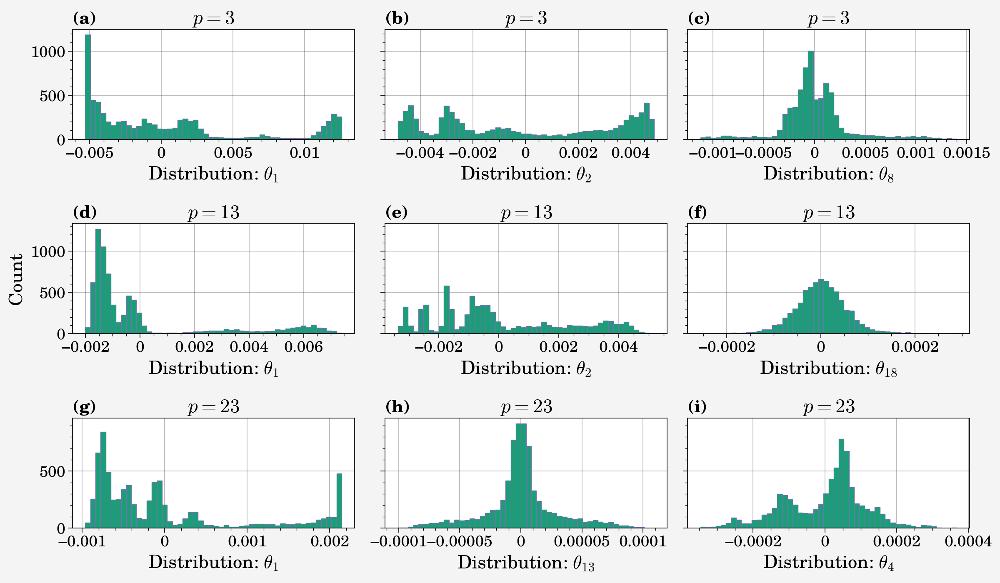

In [17]:
run = 17

pplt.rc['axes.labelsize'] = 16

fig, axs = pplt.subplots(ncols=3, nrows=3, figsize=(12, 7), sharex=False, sharey=True)

for p_i, p in enumerate([3, 13, 23]):

    file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)

    pce_total_Si = file_res['x1']
    pce_first_Si = file_res['x2']
    pce_gto_Si_diff_p = file_res['x3']
    pce_gfo_Si_diff_p = file_res['x4']       
    evals_diff_runs = file_res['x5'] # evals_diff_runs
    evecs_diff_runs = file_res['x6'] # evecs_diff_runs
    coord_diff_runs = file_res['x7'] # coord_diff_runs
    g_diff_runs = file_res['x8']     # g_diff_runs
    residuals_diff_runs = file_res['x9'] # residuals_diff_runs
    index_diff_runs = file_res['x10']    # index_diff_runs
    pce_errorr_diff_runs = file_res['x11']
    pce_mean_diff_runs = file_res['x12']
    pce_std_diff_runs = file_res['x13']


    for coord_i, coord_n in enumerate(coord_diff_runs[run]):
        axs[p_i*3+coord_i].hist(g_diff_runs[run][:, coord_i], bins=50, 
                          facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.5)
        axs[p_i*3+coord_i].format(abc='(a)', 
                                  xlabel=r'Distribution: $\theta_{{{}}}$'.format(coord_n), 
                                  ylabel=r'Count', title=r'$p={{{}}}$'.format(p), titlesize=17)
        
fig.tight_layout()
plt.savefig(f'plots/run{run}_coord_dist_diff_p.pdf', bbox_inches='tight')
plt.show()


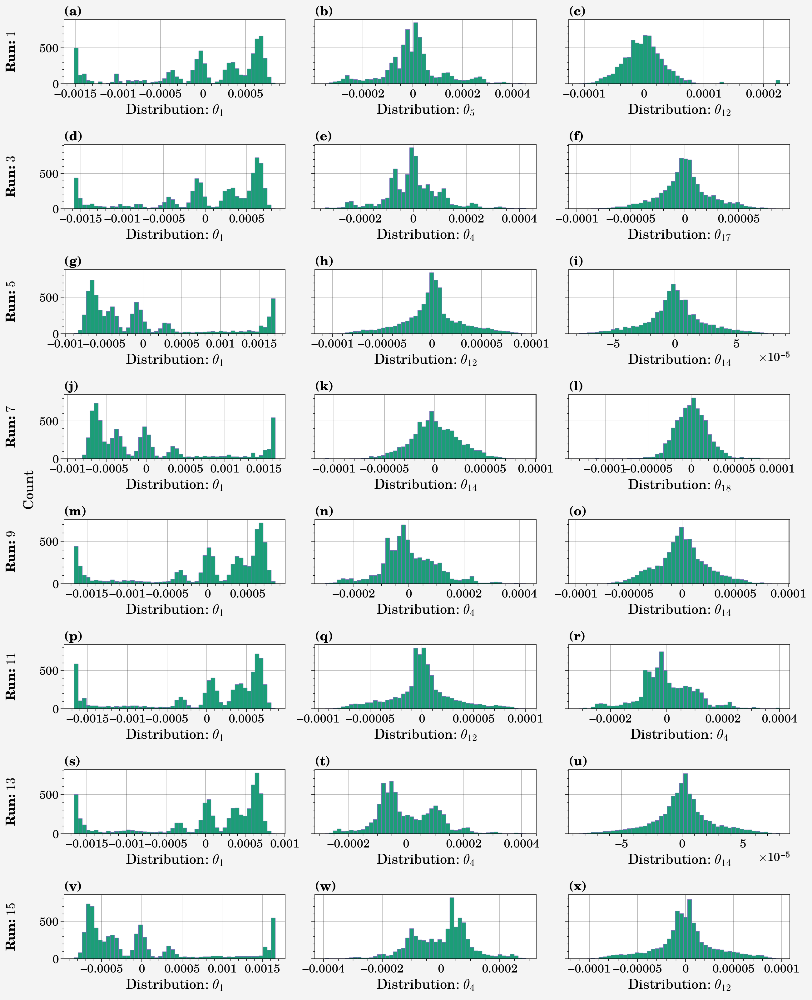

In [18]:
p=24

file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)

pce_total_Si = file_res['x1']
pce_first_Si = file_res['x2']
pce_gto_Si_diff_p = file_res['x3']
pce_gfo_Si_diff_p = file_res['x4']       
evals_diff_runs = file_res['x5'] # evals_diff_runs
evecs_diff_runs = file_res['x6'] # evecs_diff_runs
coord_diff_runs = file_res['x7'] # coord_diff_runs
g_diff_runs = file_res['x8']     # g_diff_runs
residuals_diff_runs = file_res['x9'] # residuals_diff_runs
index_diff_runs = file_res['x10']    # index_diff_runs
pce_errorr_diff_runs = file_res['x11']
pce_mean_diff_runs = file_res['x12']
pce_std_diff_runs = file_res['x13']


fig, axs = pplt.subplots(ncols=3, nrows=8, figsize=(13, 16), sharex=False, sharey=True)

for run_i, run in enumerate(np.arange(0,16,2)):
    
    for coord_i, coord_n in enumerate(coord_diff_runs[run]):
        axs[run_i*3+coord_i].hist(g_diff_runs[run][:, coord_i], bins=50, 
                          facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.5)
        axs[run_i*3+coord_i].format(abc='(a)', 
                                    xlabel=r'Distribution: $\theta_{{{}}}$'.format(coord_n), 
                                    ylabel=r'Count')
axs.format(leftlabels=[r'Run: ${{{}}}$'.format(run+1) for run in np.arange(0,16,2)])

fig.tight_layout()
plt.savefig(f'plots/runs_coord_dist_p{p}.pdf', bbox_inches='tight')
plt.show()


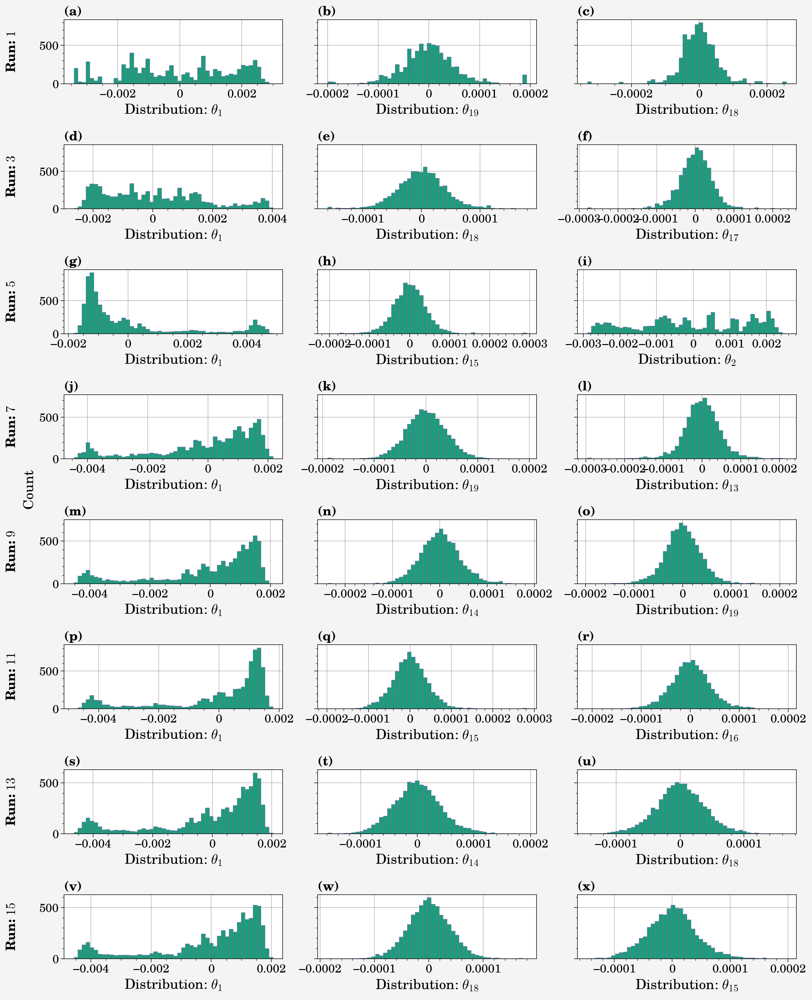

In [19]:
p=17

file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)

pce_total_Si = file_res['x1']
pce_first_Si = file_res['x2']
pce_gto_Si_diff_p = file_res['x3']
pce_gfo_Si_diff_p = file_res['x4']       
evals_diff_runs = file_res['x5'] # evals_diff_runs
evecs_diff_runs = file_res['x6'] # evecs_diff_runs
coord_diff_runs = file_res['x7'] # coord_diff_runs
g_diff_runs = file_res['x8']     # g_diff_runs
residuals_diff_runs = file_res['x9'] # residuals_diff_runs
index_diff_runs = file_res['x10']    # index_diff_runs
pce_errorr_diff_runs = file_res['x11']
pce_mean_diff_runs = file_res['x12']
pce_std_diff_runs = file_res['x13']


fig, axs = pplt.subplots(ncols=3, nrows=8, figsize=(13, 16), sharex=False, sharey=True)

for run_i, run in enumerate(np.arange(0,16,2)):
    
    for coord_i, coord_n in enumerate(coord_diff_runs[run]):
        axs[run_i*3+coord_i].hist(g_diff_runs[run][:, coord_i], bins=50, 
                          facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.5)
        axs[run_i*3+coord_i].format(abc='(a)', 
                                    xlabel=r'Distribution: $\theta_{{{}}}$'.format(coord_n), 
                                    ylabel=r'Count')
axs.format(leftlabels=[r'Run: ${{{}}}$'.format(run+1) for run in np.arange(0,16,2)])

fig.tight_layout()
plt.savefig(f'plots/runs_coord_dist_p{p}.pdf', bbox_inches='tight')
plt.show()

In [20]:
p_array = [3, 13, 17, 22, 23, 24]

# parsimonious data
parsim_pce_total_Si_mean_p = {}
parsim_pce_first_Si_mean_p = {}
parsim_pce_total_Si_var_p = {}
parsim_pce_first_Si_var_p = {}

parsim_evals_p = {}
parsim_coords_p = {}
parsim_gs_p = {}

for p in p_array:
    file_res = np.load(f'GSA_results/parsim/PCE25/parsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)  
    pce_total_Si = file_res['x1']
    pce_first_Si = file_res['x2']
    pce_gto_Si_diff_p = file_res['x3']
    pce_gfo_Si_diff_p = file_res['x4']       
    evals_diff_runs = file_res['x5'] 
    evecs_diff_runs = file_res['x6'] 
    coord_diff_runs = file_res['x7'] 
    g_diff_runs = file_res['x8']     
    residuals_diff_runs = file_res['x9'] 
    index_diff_runs = file_res['x10']    
    pce_errorr_diff_runs = file_res['x11']
    pce_mean_diff_runs = file_res['x12']
    pce_std_diff_runs = file_res['x13']
    
    parsim_pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
    parsim_pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
    parsim_pce_total_Si_var_p[p] = pce_total_Si.var(axis=0, ddof=1)
    parsim_pce_first_Si_var_p[p] = pce_first_Si.var(axis=0, ddof=1)
    
    parsim_evals_p[p] = evals_diff_runs
    parsim_coords_p[p] = coord_diff_runs
    parsim_gs_p[p] = g_diff_runs
    
    
    
# non-parsimonious data    
np_pce_total_Si_mean_p = {}
np_pce_first_Si_mean_p = {}
np_pce_total_Si_var_p = {}
np_pce_first_Si_var_p = {}

np_coords_p = {}
np_gs_p = {}

for p in p_array:
    file_res = np.load(f'GSA_results/nonparsim/PCE25/nonparsim_1024_input_20_runs_PCE_25_p_{p}.npz', 
                       allow_pickle=True)
    
    pce_total_Si = file_res['x1']
    pce_first_Si = file_res['x2']     

    coord_diff_runs = file_res['x7'] 
    g_diff_runs = file_res['x8']     
    
    np_pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
    np_pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
    np_pce_total_Si_var_p[p] = pce_total_Si.var(axis=0, ddof=1)
    np_pce_first_Si_var_p[p] = pce_first_Si.var(axis=0, ddof=1)
    
    np_coords_p[p] = coord_diff_runs
    np_gs_p[p] = g_diff_runs
    


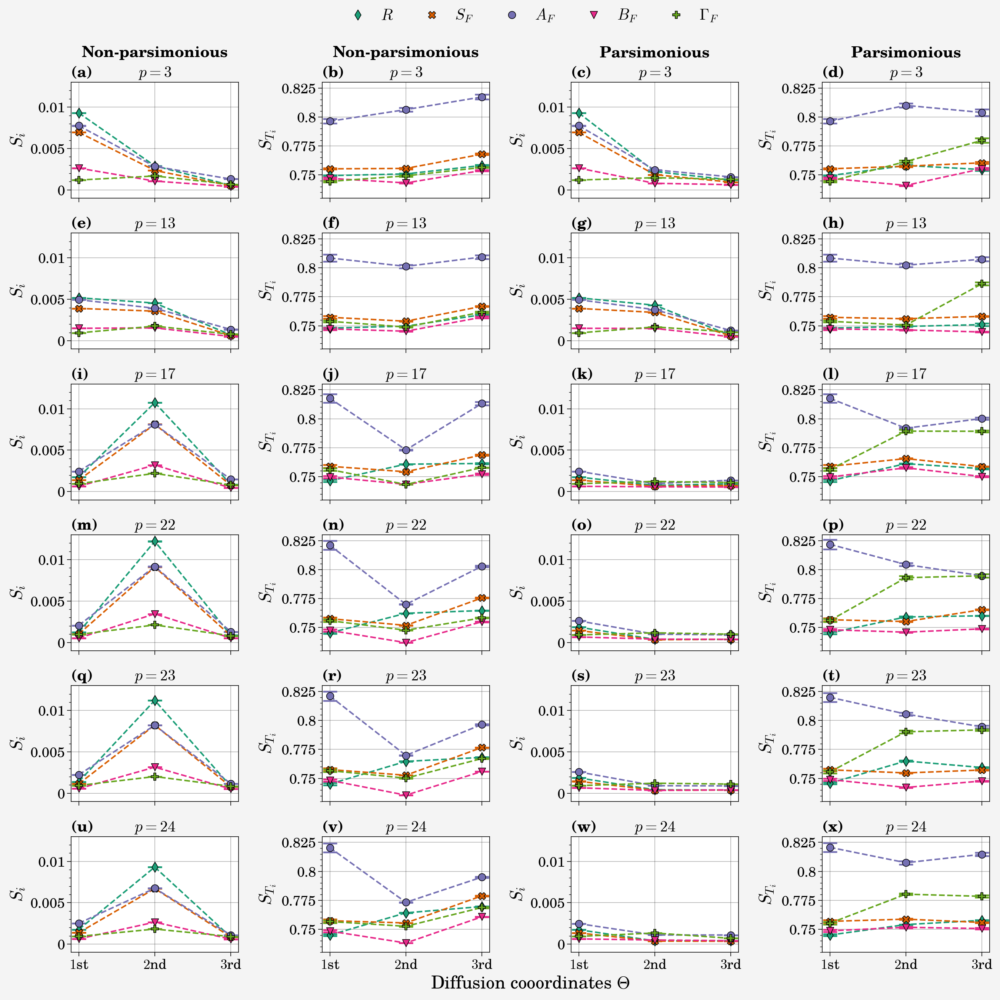

In [21]:
pplt.rc['axes.labelsize'] = 17

fig, axs = pplt.subplots(ncols=4, nrows=6, figsize=(13.5, 13.5), sharex=True, sharey=False)

col1 = np.linspace(0, 20, 6, dtype='int')
col2 = np.linspace(1, 21, 6, dtype='int')
col3 = np.linspace(2, 22, 6, dtype='int')
col4 = np.linspace(3, 23, 6, dtype='int')

error_marker_styles = ['d', 'X','o', 'v', 'P', 's', '*']
colors=mcp.gen_color(cmap="Dark2",n=9)


for p_ind, p in enumerate(p_array):
    for i, param in enumerate(param_names_short.values()):
        
        
        axs[col1[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 np_pce_first_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col1[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  np_pce_first_Si_mean_p[p][i], 
                                  np_pce_first_Si_var_p[p][i], 
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col1[p_ind]].format(ylabel=r'$S_i$', ylim=(-0.001, 0.013))
        axs[col1[p_ind]].format(title=r'$p={}$'.format(p))
        
        axs[col2[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 np_pce_total_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col2[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  np_pce_total_Si_mean_p[p][i], 
                                  np_pce_total_Si_var_p[p][i], 
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col2[p_ind]].format(ylabel=r'$S_{T_i}$', ylim=(0.73, 0.83))
        axs[col2[p_ind]].format(title=r'$p={}$'.format(p))
        
        axs[col3[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 parsim_pce_first_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col3[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  parsim_pce_first_Si_mean_p[p][i], 
                                  parsim_pce_first_Si_var_p[p][i],  
                                  color=colors[i],
                                  markeredgewidth=1.7, 
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col3[p_ind]].format(ylabel=r'$S_i$', ylim=(-0.001, 0.013))
        axs[col3[p_ind]].format(title=r'$p={}$'.format(p))
                                
        axs[col4[p_ind]].scatter(np.linspace(1, 3, 3, dtype='int'), 
                                 parsim_pce_total_Si_mean_p[p][i], color=colors[i],
                                 label=param, edgecolor='k', 
                                 marker=error_marker_styles[i], 
                                 markersize=50, zorder=3)   
        axs[col4[p_ind]].errorbar(np.linspace(1, 3, 3, dtype='int'), 
                                  parsim_pce_total_Si_mean_p[p][i], 
                                  parsim_pce_total_Si_var_p[p][i],  
                                  color=colors[i],
                                  markeredgewidth=1.7,
                                  linestyle='--', capsize=7, alpha=1, elinewidth=1.2) 
        axs[col4[p_ind]].format(ylabel=r'$S_{T_i}$', ylim=(0.73, 0.83))
        axs[col4[p_ind]].format(title=r'$p={}$'.format(p))
         
    for ax in axs:
        ax.format(abc='(a)', xlabel=r'Diffusion cooordinates $\mathbf{\Theta}$', 
                  xticklabels=['0', r'$1$st', r'$2$nd', r'$3$rd'])
axs.format(toplabels=('Non-parsimonious', 'Non-parsimonious',
                      'Parsimonious', 'Parsimonious'))
            
fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 15, bbox_to_anchor=(0.5, 1.9))

fig.tight_layout()
plt.savefig('plots/GDMaps_PCE_GSA_parsim_np.pdf', bbox_inches='tight')
plt.show()       

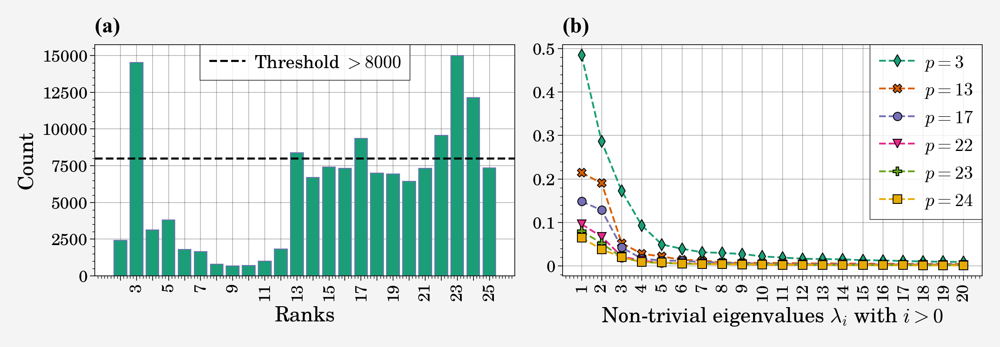

In [22]:
marker_styles = ['d--', 'X--', 'o--',  'v--', 'P--', 's--','*--']
colors=mcp.gen_color(cmap="Dark2",n=9)

run = 3

fig, axs = plt.subplots(ncols=2, nrows=1, figsize=(11.5, 4))
                        
for i, p in enumerate(p_array):
    axs[1].plot(np.arange(1, len(parsim_evals_p[p][run]), 1), 
                parsim_evals_p[p][run][1:], marker_styles[i], 
                label=r'$p={}$'.format(p), color=colors[i],
                markeredgecolor='k', markeredgewidth=0.7,
                markersize=7)
    axs[1].set_xlabel(r'Non-trivial eigenvalues $\lambda_i$ with $i > 0$')
    axs[1].legend(fontsize=15)
    xticks = np.arange(1, len(parsim_evals_p[p][run]), 1)
    axs[1].set_xticks(xticks,
                      ['{}'.format(num) for num in xticks], 
                      rotation=90)
axs[1].set_title('(b)', fontname="Times New Roman", size=18,
                 fontweight="bold", loc='left', pad=10)
    
axs[0].bar(unique, counts, facecolor = '#1b9e77', edgecolor='#7570b3', linewidth=0.7)
xticks_label = ['{}'.format(num) if num % 2 != 0 else ' ' for num in unique]
axs[0].set_xticks(unique, xticks_label, rotation=90)
axs[0].axhline(y=8000, xmin=0, xmax=26, c='k', 
               linewidth=1.7, ls='--', zorder=1, label=r'Threshold $>8000$')
axs[0].legend(fontsize=15)
axs[0].set(ylabel = r'Count', xlabel = r'Ranks')
axs[0].set_title('(a)', fontname="Times New Roman", size=18,
                 fontweight="bold", loc='left', pad=10)

plt.tight_layout()
plt.savefig('plots/ranks_hist_egenvals_diff_p.pdf', bbox_inches='tight')
plt.show()

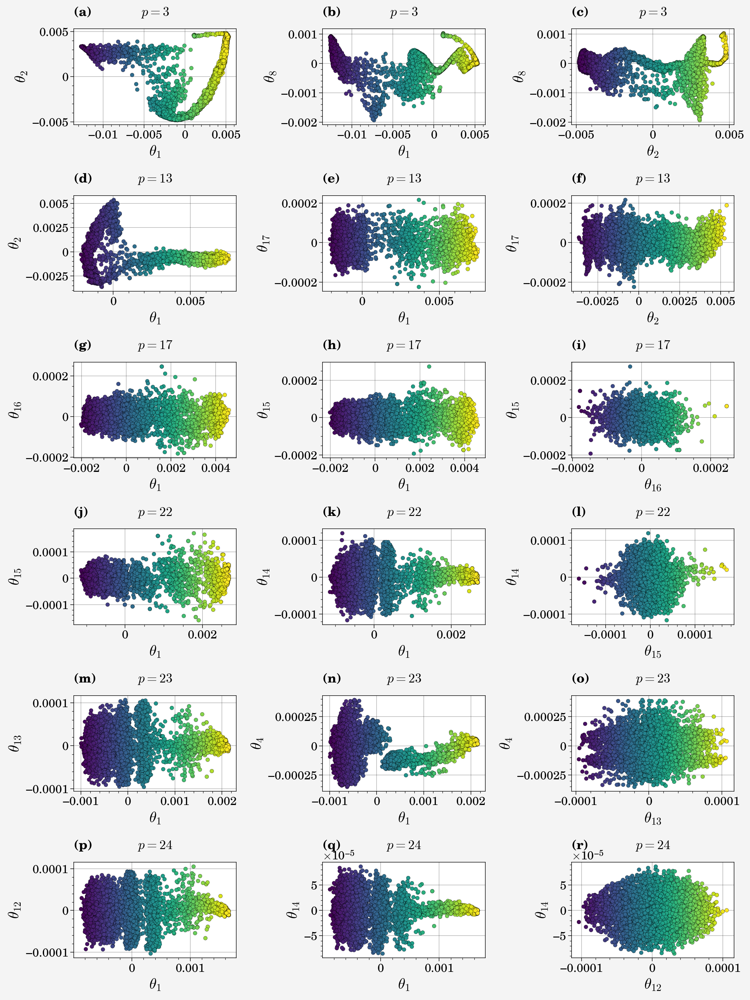

In [23]:
run = 16

pplt.rc['title.pad']= 15.0 # default 5.0


fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(12, 16), sharex=False, sharey=False)

for row, p in enumerate(p_array):
    
    axs[row*3].scatter(parsim_gs_p[p][run][:, 0], parsim_gs_p[p][run][:, 1], 
                       c=parsim_gs_p[p][run][:, 0], cmap='viridis', 
                       s=20, edgecolors='k', linewidth=0.2)
    
    axs[row*3].format(xlabel=r'$\theta_{{{}}}$'.format(parsim_coords_p[p][run][0]),
                      ylabel=r'$\theta_{{{}}}$'.format(parsim_coords_p[p][run][1]),
                      title=r'$p={}$'.format(p))
    
    axs[row*3+1].scatter(parsim_gs_p[p][run][:, 0], parsim_gs_p[p][run][:, 2], 
                         c=parsim_gs_p[p][run][:, 0], cmap='viridis', 
                         s=20, edgecolors='k', linewidth=0.2)
    axs[row*3+1].format(xlabel=r'$\theta_{{{}}}$'.format(parsim_coords_p[p][run][0]),
                        ylabel=r'$\theta_{{{}}}$'.format(parsim_coords_p[p][run][2]),
                        title=r'$p={}$'.format(p))
    
    axs[row*3+2].scatter(parsim_gs_p[p][run][:, 1], parsim_gs_p[p][run][:, 2], 
                         c=parsim_gs_p[p][run][:, 1], cmap='viridis', 
                         s=20, edgecolors='k', linewidth=0.2)
    axs[row*3+2].format(xlabel=r'$\theta_{{{}}}$'.format(parsim_coords_p[p][run][1]),
                        ylabel=r'$\theta_{{{}}}$'.format(parsim_coords_p[p][run][2]),
                        title=r'$p={}$'.format(p))
    for ax in axs:
        ax.format(abc='(a)')
    
fig.tight_layout()
plt.savefig('plots/parsim_dcoords_run16.png', dpi=300, bbox_inches='tight')
plt.show()


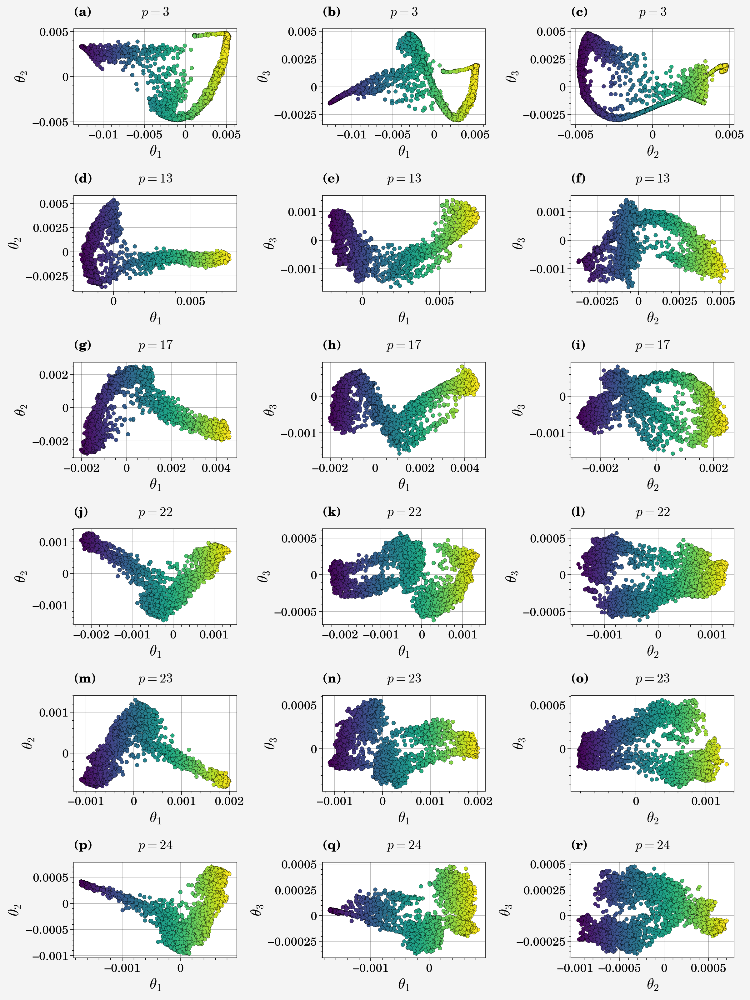

In [24]:
run = 16

pplt.rc['title.pad']= 15.0 # default 5.0

fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(12, 16), sharex=False, sharey=False)

for row, p in enumerate(p_array):
    
    axs[row*3].scatter(np_gs_p[p][run][:, 0], np_gs_p[p][run][:, 1], 
                       c=np_gs_p[p][run][:, 0], cmap='viridis', 
                       s=20, edgecolors='k', linewidth=0.2)
    
    axs[row*3].format(xlabel=r'$\theta_{{{}}}$'.format(np_coords_p[p][run][0]),
                      ylabel=r'$\theta_{{{}}}$'.format(np_coords_p[p][run][1]),
                      title=r'$p={}$'.format(p))
    
    axs[row*3+1].scatter(np_gs_p[p][run][:, 0], np_gs_p[p][run][:, 2], 
                         c=np_gs_p[p][run][:, 0], cmap='viridis', 
                         s=20, edgecolors='k', linewidth=0.2)
    axs[row*3+1].format(xlabel=r'$\theta_{{{}}}$'.format(np_coords_p[p][run][0]),
                        ylabel=r'$\theta_{{{}}}$'.format(np_coords_p[p][run][2]),
                        title=r'$p={}$'.format(p))
    
    axs[row*3+2].scatter(np_gs_p[p][run][:, 1], np_gs_p[p][run][:, 2], 
                         c=np_gs_p[p][run][:, 1], cmap='viridis', 
                         s=20, edgecolors='k', linewidth=0.2)
    axs[row*3+2].format(xlabel=r'$\theta_{{{}}}$'.format(np_coords_p[p][run][1]),
                        ylabel=r'$\theta_{{{}}}$'.format(np_coords_p[p][run][2]),
                        title=r'$p={}$'.format(p))
    for ax in axs:
        ax.format(abc='(a)')
    
fig.tight_layout()
plt.savefig('plots/nonparsim_dcoords_run16.png', dpi=300, bbox_inches='tight')
plt.show()

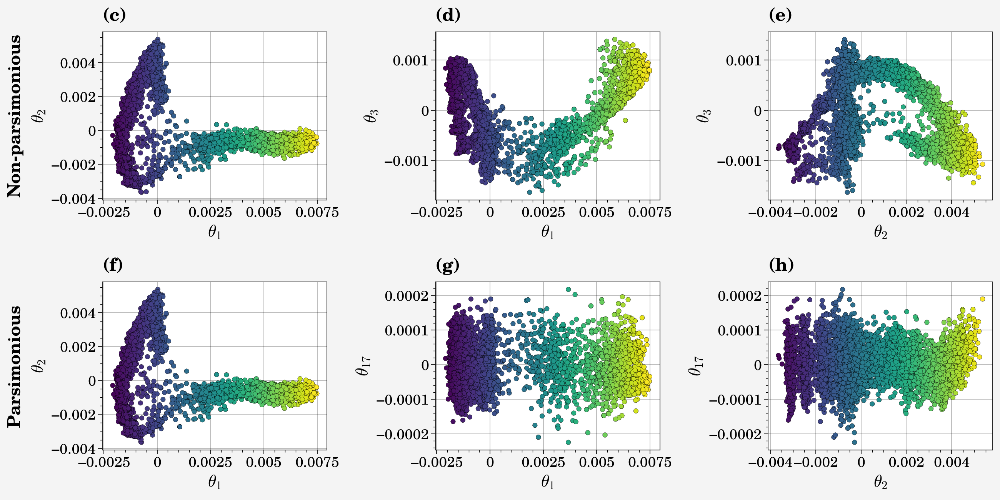

In [25]:
pplt.rc['title.pad']= 5.0 # default 5.0
pplt.rc['axes.labelsize'] = 16

numbering = ['(c)', '(d)', '(e)', '(f)', '(g)', '(h)']

run = 16
p = 13
fig, axs = pplt.subplots(ncols=3, nrows=2, figsize=(13, 6.5), sharex=False, sharey=False)

coord_data = [np_coords_p, parsim_coords_p]

for row, g_data in enumerate([np_gs_p, parsim_gs_p]):
    axs[row*3].scatter(g_data[p][run][:, 0], g_data[p][run][:, 1], 
                       c=g_data[p][run][:, 0], cmap='viridis', 
                       s=20, edgecolors='k', linewidth=0.2)

    axs[row*3].format(xlabel=r'$\theta_{{{}}}$'.format(coord_data[row][p][run][0]),
                      ylabel=r'$\theta_{{{}}}$'.format(coord_data[row][p][run][1]))
    
    axs[row*3+1].scatter(g_data[p][run][:, 0], g_data[p][run][:, 2], 
                         c=g_data[p][run][:, 0], cmap='viridis', 
                         s=20, edgecolors='k', linewidth=0.2)
    axs[row*3+1].format(xlabel=r'$\theta_{{{}}}$'.format(coord_data[row][p][run][0]),
                        ylabel=r'$\theta_{{{}}}$'.format(coord_data[row][p][run][2]))

    axs[row*3+2].scatter(g_data[p][run][:, 1], g_data[p][run][:, 2], 
                         c=parsim_gs_p[p][run][:, 1], cmap='viridis', 
                         s=20, edgecolors='k', linewidth=0.2)
    axs[row*3+2].format(xlabel=r'$\theta_{{{}}}$'.format(coord_data[row][p][run][1]),
                        ylabel=r'$\theta_{{{}}}$'.format(coord_data[row][p][run][2]))
    
for i, ax in enumerate(axs):
    ax.format(title=numbering[i], titleloc='left', 
              titlepad=10, titleweight='bold', titlesize=17)

axs.format(leftlabels=['Non-parsimonious', 'Parsimonious'], leftlabelsize=16)

fig.tight_layout()
plt.savefig('plots/GDMaps_parsim_nonparsim_coords_16.png', dpi=300, bbox_inches='tight')
plt.show()       


In [26]:
p_array = [3, 13, 17, 22, 23, 24]
max_degree = [10, 15, 20, 25]

pce_total_Si_mean_p_d = {}
pce_first_Si_mean_p_d = {}
pce_total_Si_var_p_d = {}
pce_first_Si_var_p_d = {}

pce_errorr_mean_d  = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_std_d = np.zeros((len(max_degree), len(p_array), 3))
pce_errorr_var_d = np.zeros((len(max_degree), len(p_array), 3))

for d_ind, d in enumerate(max_degree):
    pce_total_Si_mean_p = {}
    pce_first_Si_mean_p = {}
    pce_total_Si_var_p = {}
    pce_first_Si_var_p = {}
    
    pce_errorr_mean_p = {}
    pce_errorr_std_p = {}
    pce_errorr_var_p = {}
    
    for p_ind, p in enumerate(p_array):
        file_res = np.load(f'GSA_results/parsim/PCE{d}/parsim_1024_input_20_runs_PCE_{d}_p_{p}.npz', 
                           allow_pickle=True)
        pce_total_Si = file_res['x1']
        pce_first_Si = file_res['x2']
        
        pce_errorr_diff_runs = file_res['x11']

        pce_total_Si_mean_p[p] = pce_total_Si.mean(axis=0)
        pce_first_Si_mean_p[p] = pce_first_Si.mean(axis=0)
        pce_total_Si_var_p[p]  = pce_total_Si.var(axis=0, ddof=1)
        pce_first_Si_var_p[p]  = pce_first_Si.var(axis=0, ddof=1)
        
        pce_errorr_mean_d[d_ind, p_ind] = pce_errorr_diff_runs.mean(axis=0)
        pce_errorr_std_d[d_ind, p_ind]  = pce_errorr_diff_runs.std(axis=0, ddof=1)
        pce_errorr_var_d[d_ind, p_ind]  = pce_errorr_diff_runs.var(axis=0, ddof=1)

    pce_total_Si_mean_p_d[d] = pce_total_Si_mean_p
    pce_first_Si_mean_p_d[d] = pce_first_Si_mean_p
    pce_total_Si_var_p_d[d] = pce_total_Si_var_p
    pce_first_Si_var_p_d[d] = pce_first_Si_var_p


In [27]:
ordinal = lambda n: "%d%s" % (n,"tsnrhtdd"[(n//10%10!=1)*(n%10<4)*n%10::4])

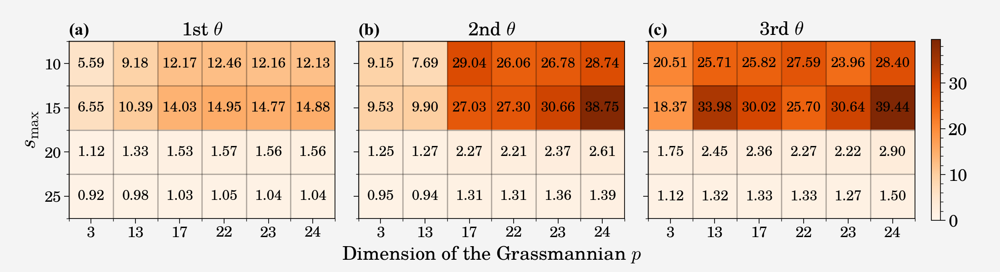

In [28]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(11, 3), sharex=True, sharey=True,
                        gridspec_kw={'width_ratios': [3, 3, 3.76]})

numbering= ['(a)', '(b)', '(c)']
for i in range(3):
    im = axs[i].imshow(pce_errorr_mean_d[:, :, i], vmin=0, vmax=39.44, cmap='Oranges')
    
    axs[i].set_xticks(np.arange(len(p_array)), labels=p_array, size=12)
    axs[i].set_yticks(np.arange(len(max_degree)), labels=max_degree, size=12)

    for row in range(len(max_degree)):
        for col in range(len(p_array)):
            text = axs[i].text(col, row, '%.2f' % pce_errorr_mean_d[:, :, i][row, col],
                               fontsize=11, color='black',
                 horizontalalignment='center',
                 verticalalignment='center')
            
    axs[i].set_xticks(np.arange(-.5, 6, 1), minor=True)
    axs[i].set_yticks(np.arange(-.5, 4, 1), minor=True)

    # Gridlines based on minor ticks
    axs[i].grid(which='minor', color='k', linestyle='-', linewidth=1)
    axs[i].grid(False)
    axs[i].set(title=ordinal(i+1)+r' $\theta$'.format(i+1))
    axs[i].set_title(numbering[i], fontname="Times New Roman", size=14,
                 fontweight="bold", loc='left')
    
    if i==1:
        axs[i].set_xlabel(r'Dimension of the Grassmannian $p$', fontsize=15)
    if i==0:
        axs[i].set_ylabel(r'$s_\max$', fontsize=17)
        
fig.colorbar(im, location='right', shrink=0.81)
plt.tight_layout()
plt.savefig('plots/GDMaps_PCE_errors_mean.pdf', bbox_inches='tight')
plt.show()




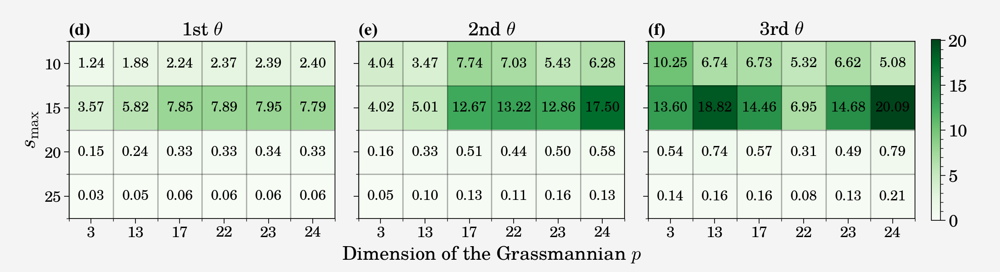

In [29]:
fig, axs = plt.subplots(ncols=3, nrows=1, figsize=(11, 3), sharex=True, sharey=True,
                       gridspec_kw={'width_ratios': [3, 3, 3.76]})
numbering= ['(d)', '(e)', '(f)']
for i in range(3):
    im = axs[i].imshow(pce_errorr_std_d[:, :, i], vmin=0, vmax=20.09, cmap='Greens')
    
    axs[i].set_xticks(np.arange(len(p_array)), labels=p_array, size=12)
    axs[i].set_yticks(np.arange(len(max_degree)), labels=max_degree, size=12)

    for row in range(len(max_degree)):
        for col in range(len(p_array)):
            text = axs[i].text(col, row, '%.2f' % pce_errorr_std_d[:, :, i][row, col],
                               fontsize=11, color='black',
                 horizontalalignment='center',
                 verticalalignment='center')
            
    axs[i].set_xticks(np.arange(-.5, 6, 1), minor=True)
    axs[i].set_yticks(np.arange(-.5, 4, 1), minor=True)

    # Gridlines based on minor ticks
    axs[i].grid(which='minor', color='k', linestyle='-', linewidth=1)
    axs[i].grid(False)
    axs[i].set(title=ordinal(i+1)+r' $\theta$'.format(i+1))
    axs[i].set_title(numbering[i], fontname="Times New Roman", size=14,
                 fontweight="bold", loc='left')
    
    if i==1:
        axs[i].set_xlabel(r'Dimension of the Grassmannian $p$', fontsize=15)
    if i==0:
        axs[i].set_ylabel(r'$s_\max$', fontsize=17)
        
fig.colorbar(im, location='right', shrink=0.81)
fig.tight_layout()
plt.savefig('plots/GDMaps_PCE_errors_std.pdf', bbox_inches='tight')
plt.show()

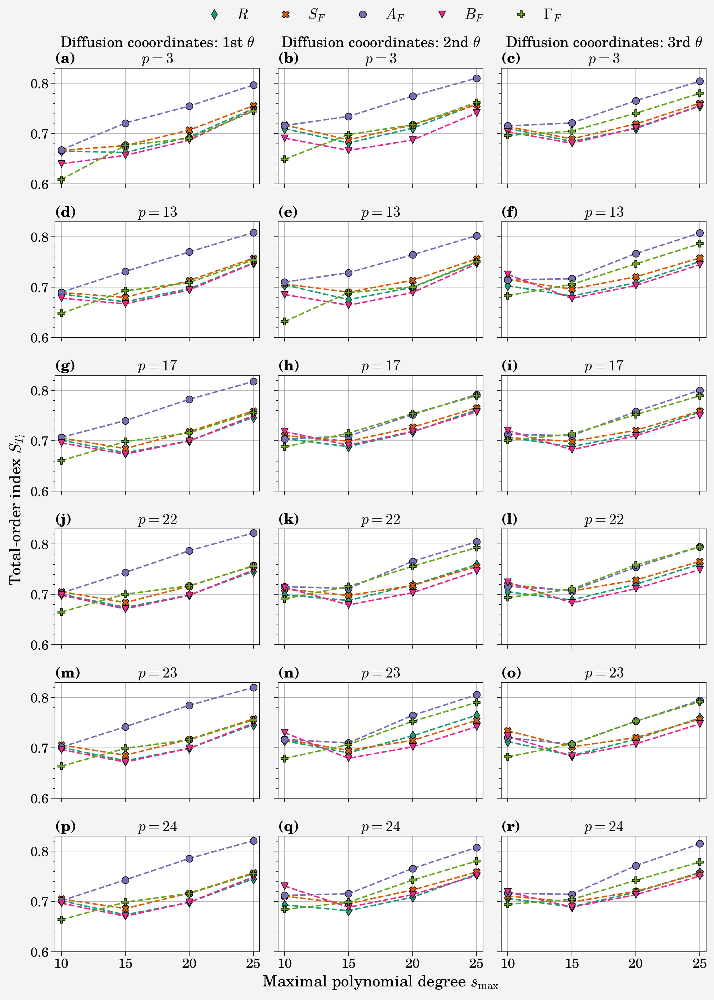

In [30]:
fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(10, 14), sharex=True)

col1 = np.linspace(0, 15, 6, dtype='int')
col2 = np.linspace(1, 16, 6, dtype='int')
col3 = np.linspace(2, 17, 6, dtype='int')

# param_styles = ['d--', 'X--', 'o--',  'v--', 'P--', 's--','*--']
marker_styles = ['d', 'X','o', 'v', 'P', 's', '*']
colors=mcp.gen_color(cmap="Dark2",n=9)

for row, p in enumerate(p_array):
    for i, param in enumerate(problem['names']):
        vars_at_d1 = []
        vars_at_d2 = []
        vars_at_d3 = []
        for d in max_degree:
            vars_at_d1.append(pce_total_Si_mean_p_d[d][p][:, 0][i])
            vars_at_d2.append(pce_total_Si_mean_p_d[d][p][:, 1][i])
            vars_at_d3.append(pce_total_Si_mean_p_d[d][p][:, 2][i])
            
        axs[col1[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col1[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                            color=colors[i], ls='--')
        axs[col2[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d2,
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col2[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d2, 
                            color=colors[i], ls='--')
        axs[col3[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            marker=marker_styles[i], label=param_names_short[param], 
                            color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col3[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            color=colors[i], ls='--')
        for ax in axs:
            ax.format(xlim=(0.9, 4.1), ylim=(0.6, 0.83), 
                      xticklabels=['0', '10', '15', '20', '25'],
                      abc='(a)', xlabel=r'Maximal polynomial degree $s_\max$', 
                      ylabel=r'Total-order index $S_{T_i}$')
        if row == 0:
            axs[col1[row]].format(title='Diffusion cooordinates: '+ 
                                  r'1st $\theta$'+'\n'+r'$p={}$'.format(p))
            axs[col2[row]].format(title='Diffusion cooordinates: '+ 
                                  r'2nd $\theta$'+'\n'+r'$p={}$'.format(p))
            axs[col3[row]].format(title='Diffusion cooordinates: '+ 
                                  r'3rd $\theta$'+'\n'+r'$p={}$'.format(p))
        else:
            axs[col1[row]].format(title=r'$p={}$'.format(p))
            axs[col2[row]].format(title=r'$p={}$'.format(p))
            axs[col3[row]].format(title=r'$p={}$'.format(p))

fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 15, title_fontsize=15.5) #label='Parameters:'

fig.tight_layout()
plt.savefig('plots/ST_diff_max_size.pdf', bbox_inches='tight')
plt.show()
    

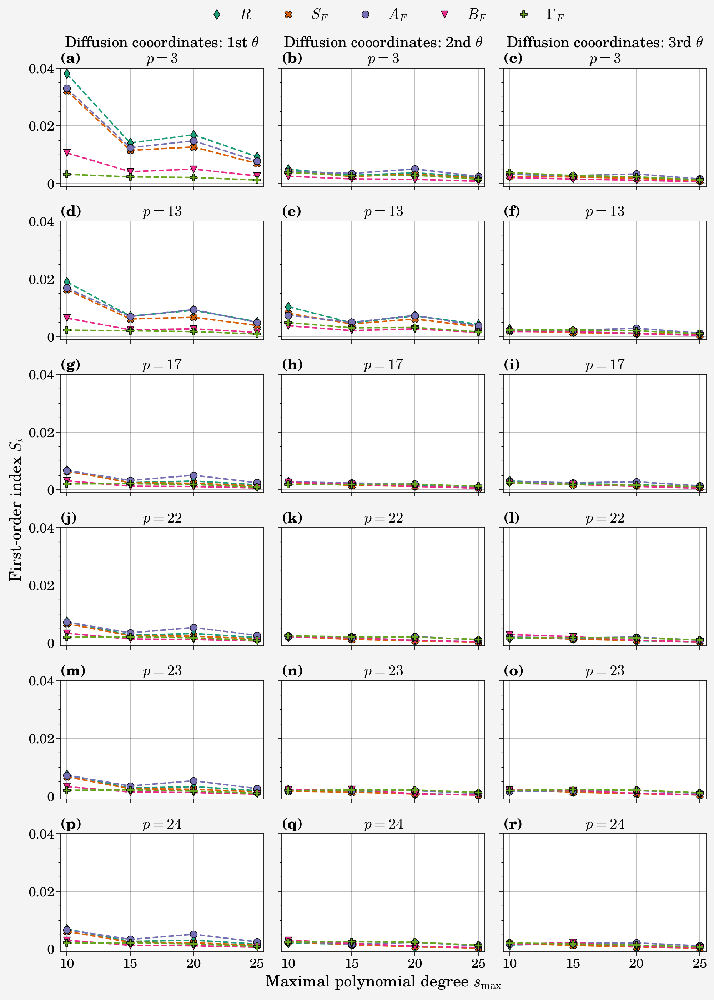

In [31]:
fig, axs = pplt.subplots(ncols=3, nrows=6, figsize=(10, 14), sharex=True)

col1 = np.linspace(0, 15, 6, dtype='int')
col2 = np.linspace(1, 16, 6, dtype='int')
col3 = np.linspace(2, 17, 6, dtype='int')

for row, p in enumerate(p_array):
    for i, param in enumerate(problem['names']):
        vars_at_d1 = []
        vars_at_d2 = []
        vars_at_d3 = []
        for d in max_degree:
            vars_at_d1.append(pce_first_Si_mean_p_d[d][p][:, 0][i])
            vars_at_d2.append(pce_first_Si_mean_p_d[d][p][:, 1][i])
            vars_at_d3.append(pce_first_Si_mean_p_d[d][p][:, 2][i])
                
        axs[col1[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col1[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d1, 
                            color=colors[i], ls='--')
        axs[col2[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d2,
                               marker=marker_styles[i], label=param_names_short[param], 
                               color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col2[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d2, 
                            color=colors[i], ls='--')
        axs[col3[row]].scatter(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            marker=marker_styles[i], label=param_names_short[param], 
                            color=colors[i], edgecolor='k', markersize=50, zorder=3)
        axs[col3[row]].plot(np.linspace(1, 4, 4, dtype='int'), vars_at_d3,
                            color=colors[i], ls='--')
        
        for ax in axs:
            ax.format(xlim=(0.9, 4.1), ylim=(-0.001, 0.04), 
                      xticklabels=['0', '10', '15', '20', '25'],
                      abc='(a)', xlabel=r'Maximal polynomial degree $s_\max$', 
                      ylabel=r'First-order index $S_i$')
        if row == 0:
            axs[col1[row]].format(title='Diffusion cooordinates: '+ 
                                  r'1st $\theta$'+'\n'+r'$p={}$'.format(p))
            axs[col2[row]].format(title='Diffusion cooordinates: '+ 
                                  r'2nd $\theta$'+'\n'+r'$p={}$'.format(p))
            axs[col3[row]].format(title='Diffusion cooordinates: '+ 
                                  r'3rd $\theta$'+'\n'+r'$p={}$'.format(p))
        else:
            axs[col1[row]].format(title=r'$p={}$'.format(p))
            axs[col2[row]].format(title=r'$p={}$'.format(p))
            axs[col3[row]].format(title=r'$p={}$'.format(p))

fig.legend(param_names_short.values(), ncols=5, frame=False, loc='t',
           fontsize = 15, title_fontsize=15.5) #label='Parameters:'

fig.tight_layout()
plt.savefig('plots/S1_diff_max_size.pdf', bbox_inches='tight')
plt.show()